# Multiple Heart Disease Prediction

Blood, essential for sustaining life, plays a vital role in transporting oxygen, nutrients, hormones, and immune factors throughout the body. Variations in its composition can lead to various diseases, including Cardiovascular Diseases (CVDs), metabolic disorders, and hematological abnormalities, presenting a significant challenge for early prediction and intervention. This project leverages the computational power of machine learning models to explore the predictive potential of classifying blood and physiological parameters to anticipate disease onset. By analyzing diverse parameters, we aim to forecast the likelihood of developing conditions such as Diabetes, Anemia, Thalassemia, Heart Disease, Thrombocytopenia, or maintaining overall health. This research represents a pivotal advancement in utilizing machine learning for comprehensive health assessment and disease prediction, offering promising implications for preventive medicine and public health management.

![Blood Disorders](https://cd.trihealth.com/-/media/trihealth/import/uploadedimages/content/dailyhealthwire/cancer/ch_blooddisorders.jpg?h=367&iar=0&w=678&hash=15055F51118F84268699B7B5DB5D4A1C)

We download the files from kaggle

In [1]:
#!kaggle datasets download -d ehababoelnaga/multiple-disease-prediction

Dataset URL: https://www.kaggle.com/datasets/ehababoelnaga/multiple-disease-prediction
License(s): Apache 2.0
  0% 0.00/285k [00:00<?, ?B/s]
100% 285k/285k [00:00<00:00, 37.5MB/s]


In [2]:
#!unzip multiple-disease-prediction.zip

Archive:  multiple-disease-prediction.zip
  inflating: Blood_samples_dataset_balanced_2(f).csv  
  inflating: blood_samples_dataset_test.csv  


This are our libraries

In [3]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
import numpy as np

We create a dataframe by combining our train and test data for data analysis

In [4]:
train = pd.read_csv("Blood_samples_dataset_balanced_2(f).csv")
test = pd.read_csv("blood_samples_dataset_test.csv")
# Let's combine 2 data frames.
df = pd.concat([train,test],ignore_index=True)

df.head()

,Glucose,Cholesterol,Hemoglobin,Platelets,White Blood Cells,Red Blood Cells,Hematocrit,Mean Corpuscular Volume,Mean Corpuscular Hemoglobin,Mean Corpuscular Hemoglobin Concentration,...,HbA1c,LDL Cholesterol,HDL Cholesterol,ALT,AST,Heart Rate,Creatinine,Troponin,C-reactive Protein,Disease
0,0.739597,0.650198,0.713631,0.868491,0.687433,0.529895,0.290006,0.631045,0.001328,0.795829,...,0.502665,0.215560,0.512941,0.064187,0.610827,0.939485,0.095512,0.465957,0.769230,Healthy
1,0.121786,0.023058,0.944893,0.905372,0.507711,0.403033,0.164216,0.307553,0.207938,0.505562,...,0.856810,0.652465,0.106961,0.942549,0.344261,0.666368,0.659060,0.816982,0.401166,Diabetes
2,0.452539,0.116135,0.544560,0.400640,0.294538,0.382021,0.625267,0.295122,0.868369,0.026808,...,0.466795,0.387332,0.421763,0.007186,0.506918,0.431704,0.417295,0.799074,0.779208,Thalasse
3,0.136609,0.015605,0.419957,0.191487,0.081168,0.166214,0.073293,0.668719,0.125447,0.501051,...,0.016256,0.040137,0.826721,0.265415,0.594148,0.225756,0.490349,0.637061,0.354094,Anemia
4,0.176737,0.752220,0.971779,0.785286,0.443880,0.439851,0.894991,0.442159,0.257288,0.805987,...,0.429431,0.146294,0.221574,0.015280,0.567115,0.841412,0.153350,0.794008,0.094970,Thalasse


#Data Anlysis

First we do some cleaning and understand our data more

In [5]:
df.shape

(2837, 25)

In [6]:
df.describe()

,Glucose,Cholesterol,Hemoglobin,Platelets,White Blood Cells,Red Blood Cells,Hematocrit,Mean Corpuscular Volume,Mean Corpuscular Hemoglobin,Mean Corpuscular Hemoglobin Concentration,...,Triglycerides,HbA1c,LDL Cholesterol,HDL Cholesterol,ALT,AST,Heart Rate,Creatinine,Troponin,C-reactive Protein
count,2837.000000,2837.000000,2837.000000,2837.000000,2837.000000,2837.000000,2837.000000,2837.000000,2837.000000,2837.000000,...,2837.000000,2837.000000,2837.000000,2837.000000,2837.000000,2837.000000,2837.000000,2837.000000,2837.000000,2837.000000
mean,0.384621,0.413031,0.568941,0.508157,0.510863,0.506205,0.506106,0.496309,0.488859,0.551795,...,0.395643,0.447721,0.435470,0.536118,0.446217,0.460282,0.567101,0.440572,0.464101,0.445221
std,0.262080,0.251023,0.278908,0.301621,0.279597,0.273070,0.287049,0.276560,0.310724,0.277234,...,0.266795,0.269223,0.260077,0.274450,0.271631,0.253810,0.260580,0.242565,0.259814,0.254098
min,0.001827,0.003088,0.000719,0.000006,-0.000206,0.000552,0.004556,0.000309,-0.000614,0.000719,...,0.001885,-0.000991,0.001036,-0.000546,-0.000312,0.002047,0.002145,0.008831,0.005714,-0.000991
25%,0.141529,0.223545,0.325035,0.202496,0.259467,0.258357,0.288132,0.287532,0.217207,0.319725,...,0.189918,0.188792,0.231304,0.296264,0.214581,0.239659,0.335346,0.214560,0.288961,0.199513
50%,0.357817,0.397638,0.597916,0.533962,0.527381,0.467431,0.493428,0.461418,0.448926,0.583470,...,0.335778,0.466375,0.424560,0.512941,0.389440,0.486317,0.599542,0.428713,0.465957,0.489070
75%,0.596150,0.603341,0.791215,0.771727,0.744950,0.743670,0.753657,0.722293,0.778160,0.741381,...,0.597671,0.670665,0.619900,0.779378,0.715823,0.620868,0.800666,0.645247,0.684140,0.633088
max,0.991742,0.999606,0.997876,0.999507,0.999646,1.000000,1.000857,0.996362,0.999234,0.999666,...,0.999826,0.999265,0.999567,1.000744,1.000326,1.000402,0.999857,0.999348,1.000125,0.999488


In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2837 entries, 0 to 2836
Data columns (total 25 columns):
 #   Column                                     Non-Null Count  Dtype  
---  ------                                     --------------  -----  
 0   Glucose                                    2837 non-null   float64
 1   Cholesterol                                2837 non-null   float64
 2   Hemoglobin                                 2837 non-null   float64
 3   Platelets                                  2837 non-null   float64
 4   White Blood Cells                          2837 non-null   float64
 5   Red Blood Cells                            2837 non-null   float64
 6   Hematocrit                                 2837 non-null   float64
 7   Mean Corpuscular Volume                    2837 non-null   float64
 8   Mean Corpuscular Hemoglobin                2837 non-null   float64
 9   Mean Corpuscular Hemoglobin Concentration  2837 non-null   float64
 10  Insulin                 

In [8]:
df.isna().sum()

Glucose                                      0
Cholesterol                                  0
Hemoglobin                                   0
Platelets                                    0
White Blood Cells                            0
Red Blood Cells                              0
Hematocrit                                   0
Mean Corpuscular Volume                      0
Mean Corpuscular Hemoglobin                  0
Mean Corpuscular Hemoglobin Concentration    0
Insulin                                      0
BMI                                          0
Systolic Blood Pressure                      0
Diastolic Blood Pressure                     0
Triglycerides                                0
HbA1c                                        0
LDL Cholesterol                              0
HDL Cholesterol                              0
ALT                                          0
AST                                          0
Heart Rate                                   0
Creatinine   

In [9]:
value_counts = df['Disease'].value_counts()
print(value_counts)

Disease
Diabetes    834
Anemia      707
Healthy     561
Thalasse    557
Thromboc    139
Heart Di     39
Name: count, dtype: int64


We plot the value count of our diseases

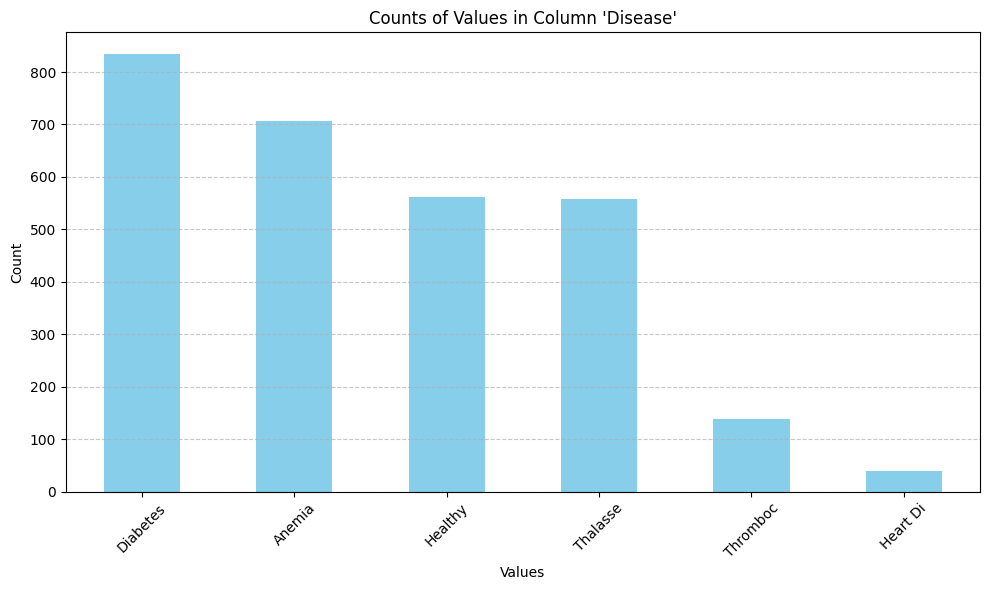

In [10]:
# Create a bar plot
plt.figure(figsize=(10, 6))
value_counts.plot(kind='bar', color='skyblue')
plt.title("Counts of Values in Column '{}'".format('Disease'))
plt.xlabel("Values")
plt.ylabel("Count")
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

We perform disease mapping to create a dataframe free of strings, facilitating further analysis without encountering issues.

In [11]:
# Define the mapping dictionary
disease_mapping = {
    'Diabetes': '1',
    'Anemia': '2',
    'Healthy': '3',
    'Thalasse': '0',
    'Thromboc': '4',
    'Heart Di': '5'
}

# Create a new DataFrame 'df_mapping' by copying 'df'
df_map = df.copy()

# Apply mapping to the 'Disease' column in 'df_mapping'
df_map['Disease'] = df_map['Disease'].map(disease_mapping)


df_map.head()

,Glucose,Cholesterol,Hemoglobin,Platelets,White Blood Cells,Red Blood Cells,Hematocrit,Mean Corpuscular Volume,Mean Corpuscular Hemoglobin,Mean Corpuscular Hemoglobin Concentration,...,HbA1c,LDL Cholesterol,HDL Cholesterol,ALT,AST,Heart Rate,Creatinine,Troponin,C-reactive Protein,Disease
0,0.739597,0.650198,0.713631,0.868491,0.687433,0.529895,0.290006,0.631045,0.001328,0.795829,...,0.502665,0.215560,0.512941,0.064187,0.610827,0.939485,0.095512,0.465957,0.769230,3
1,0.121786,0.023058,0.944893,0.905372,0.507711,0.403033,0.164216,0.307553,0.207938,0.505562,...,0.856810,0.652465,0.106961,0.942549,0.344261,0.666368,0.659060,0.816982,0.401166,1
2,0.452539,0.116135,0.544560,0.400640,0.294538,0.382021,0.625267,0.295122,0.868369,0.026808,...,0.466795,0.387332,0.421763,0.007186,0.506918,0.431704,0.417295,0.799074,0.779208,0
3,0.136609,0.015605,0.419957,0.191487,0.081168,0.166214,0.073293,0.668719,0.125447,0.501051,...,0.016256,0.040137,0.826721,0.265415,0.594148,0.225756,0.490349,0.637061,0.354094,2
4,0.176737,0.752220,0.971779,0.785286,0.443880,0.439851,0.894991,0.442159,0.257288,0.805987,...,0.429431,0.146294,0.221574,0.015280,0.567115,0.841412,0.153350,0.794008,0.094970,0


Let's do some boxplot of the diseases against every parameter to see how they react

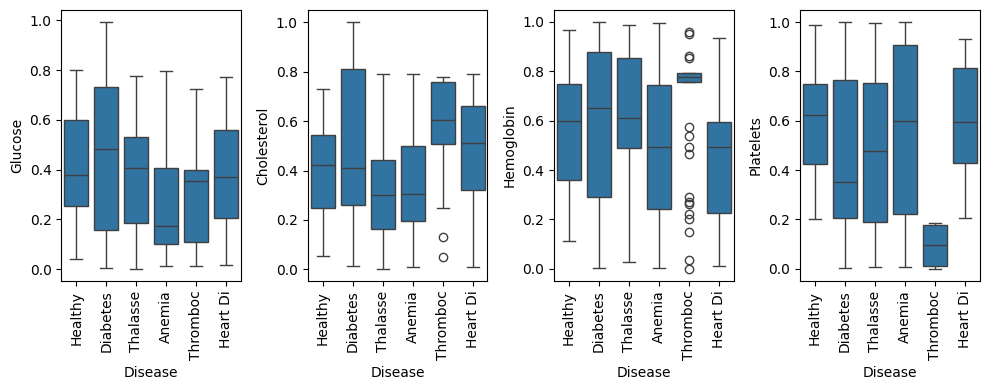

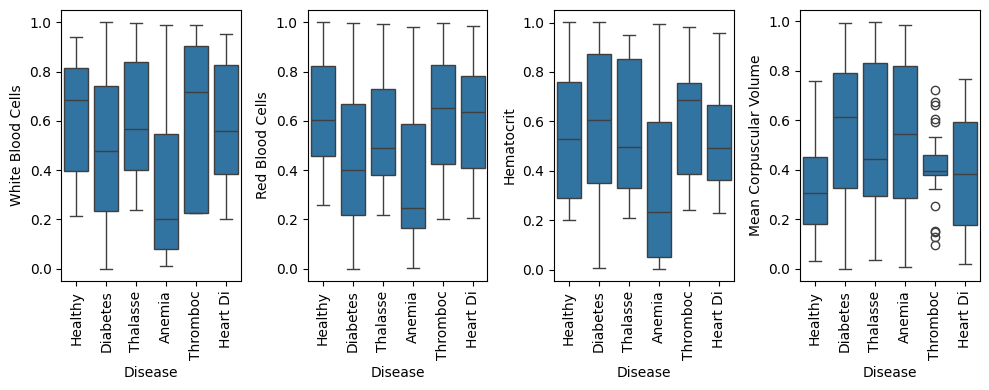

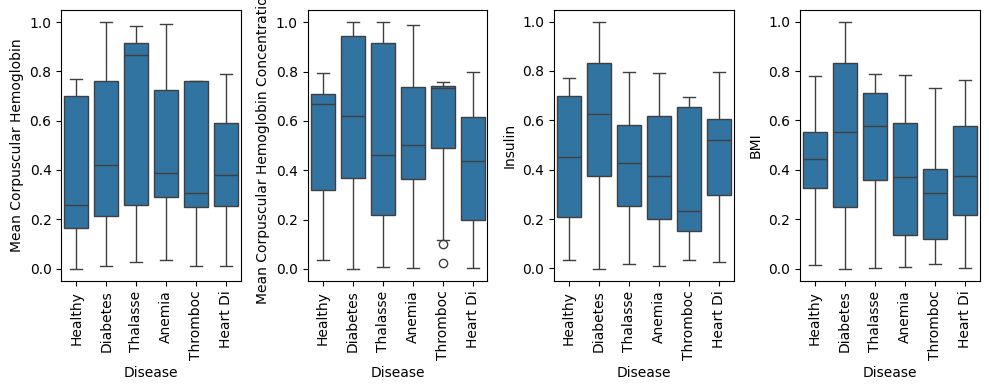

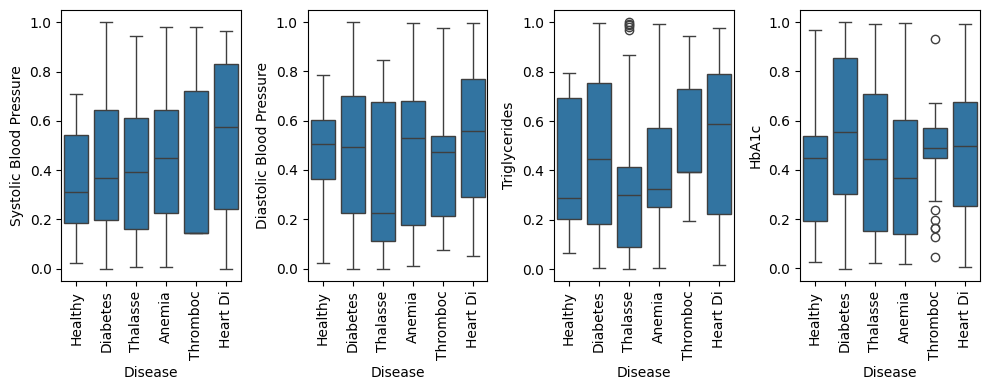

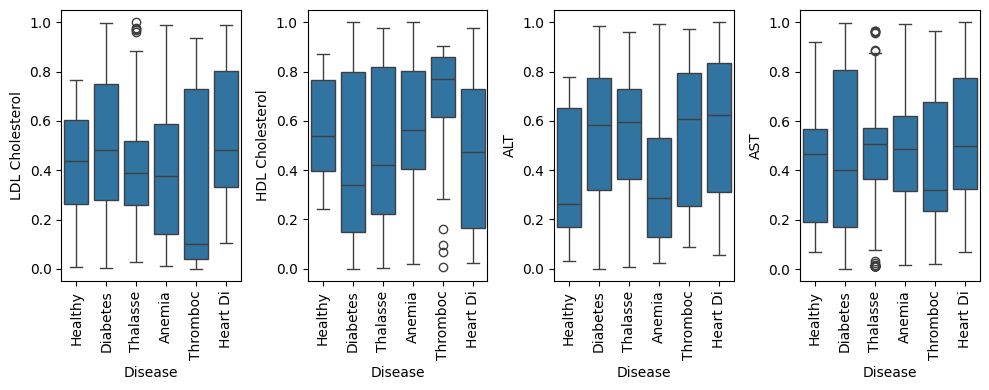

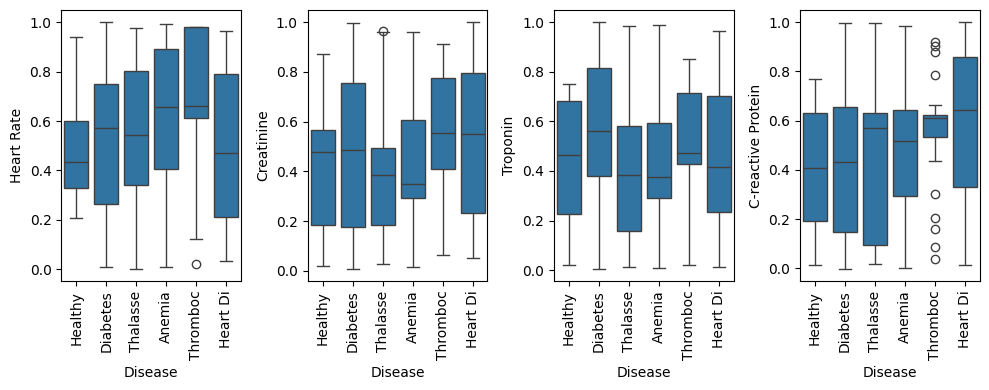

In [12]:
warnings.filterwarnings("ignore")  # Ignore all warnings

index = 0
for i in range(6):
    fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(10, 4))
    for j in range(4):
        sns.boxplot(df, x=df.columns[-1], y=df.columns[index], ax=axes[j])
        index += 1
        axes[j].set_xticklabels(axes[j].get_xticklabels(), rotation=90)
    plt.tight_layout()
    plt.show()

We do a correlation matrix to find the values that relate more to the diseases

Text(0.5, 1.0, 'Correlation Heatmap')

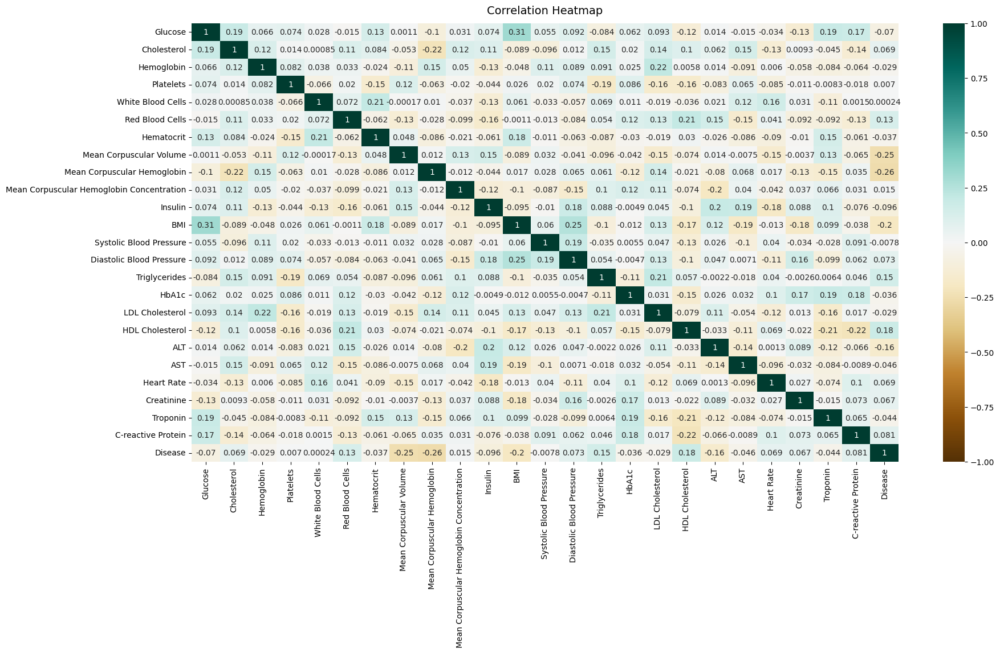

In [13]:
# Make a correlation matrix
plt.figure(figsize=(20, 10))
heatmap = sns.heatmap(df_map.corr(), vmin=-1, vmax=1, annot=True,cmap='BrBG')
heatmap.set_title('Correlation Heatmap', fontdict={'fontsize':14}, pad=12)

Now let's do a violin plot with the most important parameters from the correlation matrix

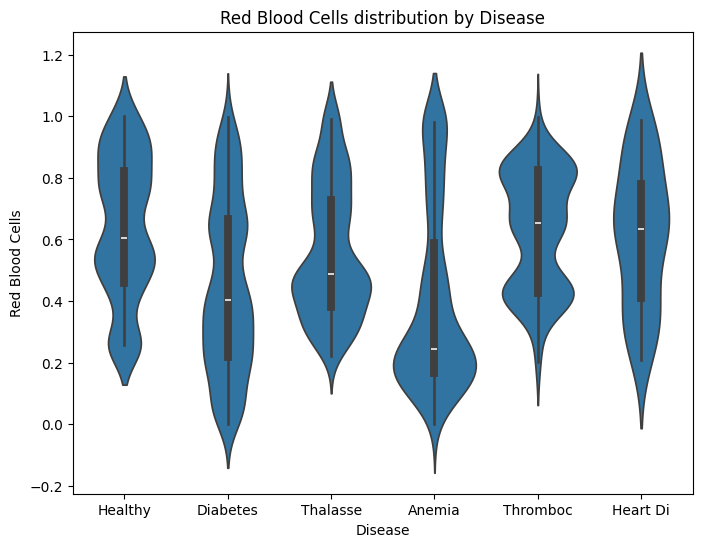

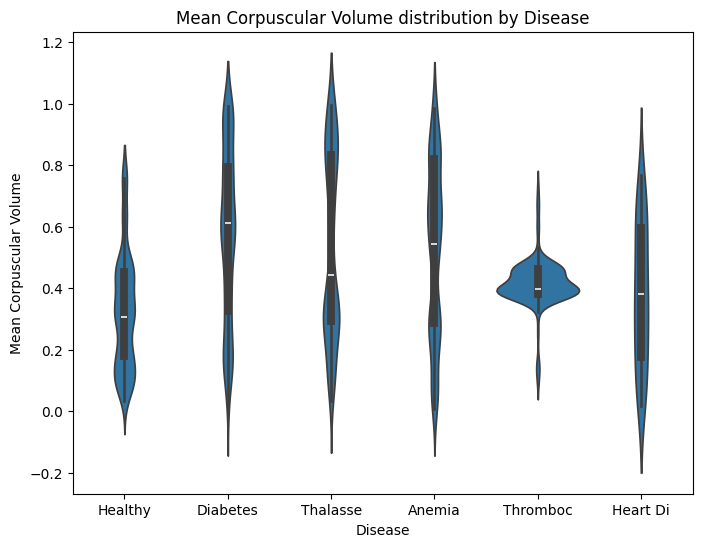

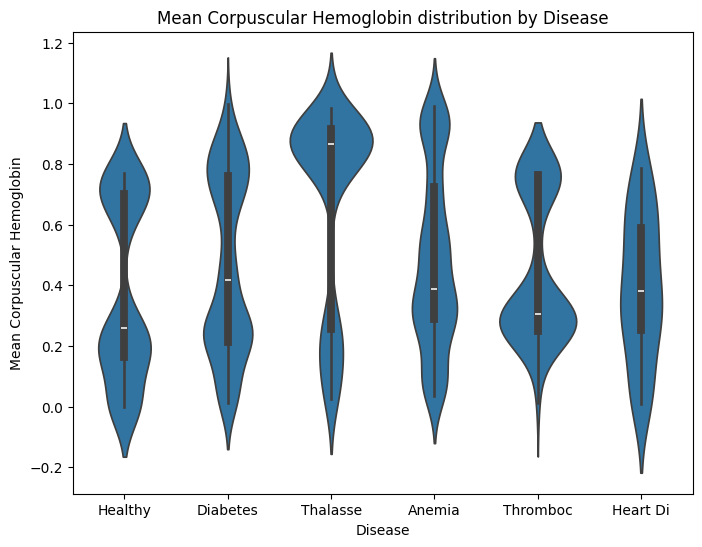

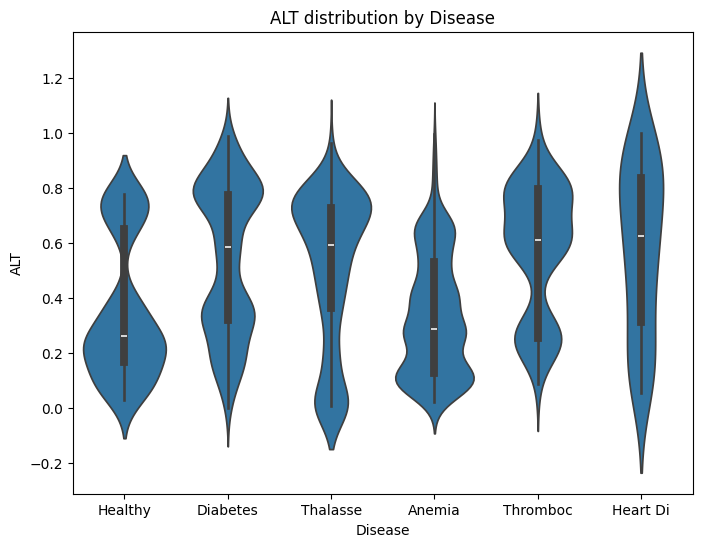

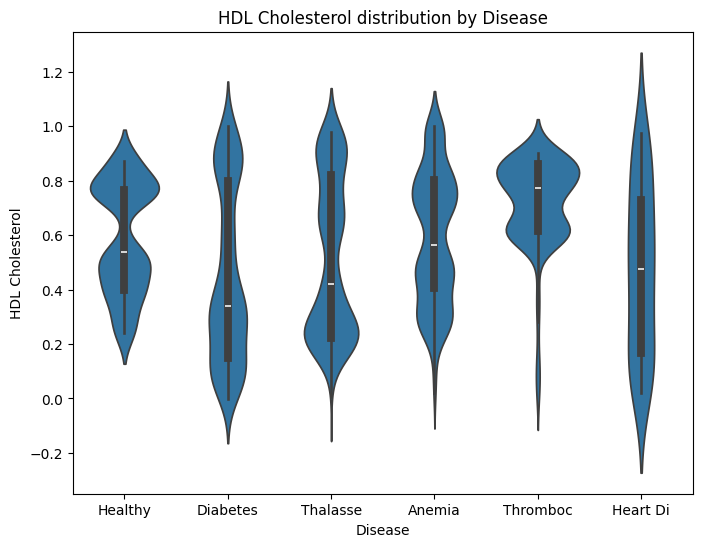

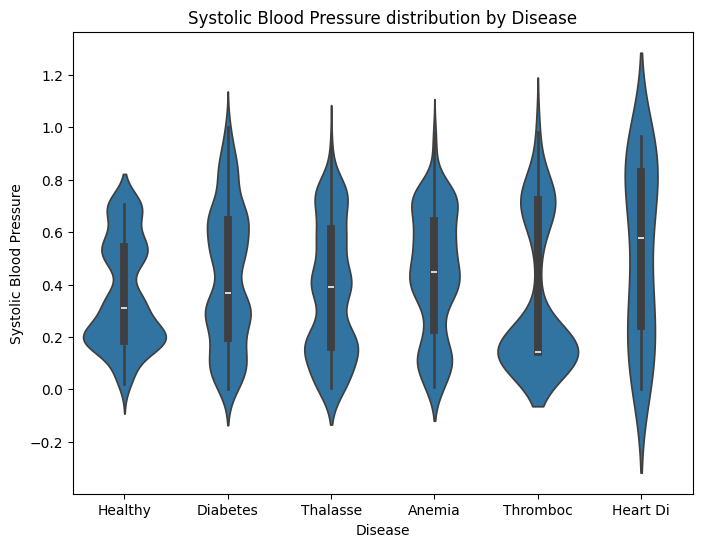

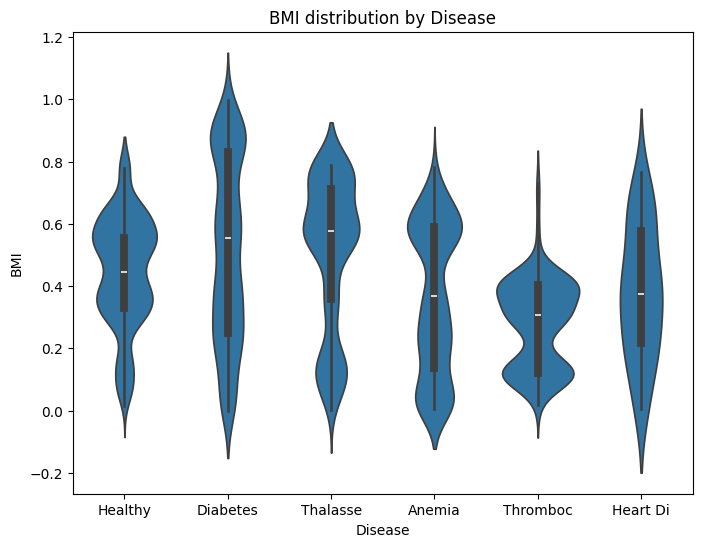

In [14]:
# Define parameters of interest
parameters_of_interest = ['Red Blood Cells', 'Mean Corpuscular Volume', 'Mean Corpuscular Hemoglobin',
                          'ALT', 'HDL Cholesterol', 'Systolic Blood Pressure', 'BMI']

# Plotting for each parameter
for param in parameters_of_interest:
    # Violin plot
    plt.figure(figsize=(8, 6))
    sns.violinplot(data=df, x='Disease', y=param)
    plt.title(f'{param} distribution by Disease')
    plt.xlabel('Disease')
    plt.ylabel(param)
    plt.show()

# Divide dataframe for train and test

Next, we will divide our dataset into two parts: 80% for training and 20% for testing. This division is necessary because the original test.csv includes an additional parameter called "Heart Di" that is not present in the Blood_samples_dataset_balanced_2(f).csv.

In [16]:
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import classification_report, confusion_matrix
from keras.models import Sequential
from keras.layers import Dense
import tensorflow as tf
from tensorflow.keras.callbacks import EarlyStopping
from sklearn.preprocessing import LabelEncoder
from sklearn.tree import plot_tree
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

In [17]:
# Splitting the combined DataFrame into training (80%) and testing (20%)
train_df, test_df = train_test_split(df_map, test_size=0.2, random_state=42)

# Display the first few rows of each DataFrame
print("Train DataFrame:")
train_df.head()

Train DataFrame:


,Glucose,Cholesterol,Hemoglobin,Platelets,White Blood Cells,Red Blood Cells,Hematocrit,Mean Corpuscular Volume,Mean Corpuscular Hemoglobin,Mean Corpuscular Hemoglobin Concentration,...,HbA1c,LDL Cholesterol,HDL Cholesterol,ALT,AST,Heart Rate,Creatinine,Troponin,C-reactive Protein,Disease
940,0.298550,0.182145,0.701824,0.418574,0.875773,0.660344,0.977520,0.459985,0.717812,0.677143,...,0.237960,0.437792,0.490455,0.029745,0.565996,0.433284,0.095771,0.283121,0.632352,3
741,0.344356,0.783918,0.582171,0.996841,0.065363,0.242885,0.658851,0.543017,0.290106,0.838722,...,0.141738,0.155871,0.473638,0.250535,0.387197,0.344728,0.606719,0.395145,0.134021,2
2798,0.725215,0.677808,0.987033,0.800944,0.789479,0.855967,0.210390,0.996362,0.801524,0.944379,...,0.038605,0.234371,0.893923,0.395923,0.296394,0.065796,0.254005,0.525764,0.812486,0
2204,0.400326,0.195818,0.743529,0.133745,0.721064,0.197552,0.688592,0.821186,0.931951,0.428604,...,0.026747,0.587579,0.688191,0.127780,0.616181,0.636629,0.308070,0.292787,0.521284,2
787,0.086810,0.271507,0.841366,0.954619,0.412914,0.332666,0.885491,0.991943,0.206693,0.442733,...,0.853538,0.293808,0.150089,0.829810,0.236373,0.139593,0.795061,0.772244,0.550695,1


In [18]:
print("\nTest DataFrame:")
test_df.head()


Test DataFrame:


,Glucose,Cholesterol,Hemoglobin,Platelets,White Blood Cells,Red Blood Cells,Hematocrit,Mean Corpuscular Volume,Mean Corpuscular Hemoglobin,Mean Corpuscular Hemoglobin Concentration,...,HbA1c,LDL Cholesterol,HDL Cholesterol,ALT,AST,Heart Rate,Creatinine,Troponin,C-reactive Protein,Disease
415,0.399017,0.508254,0.777394,0.096310,0.925520,0.652505,0.684896,0.380656,0.248189,0.490245,...,0.673188,0.033037,0.772045,0.253892,0.322486,0.659069,0.774219,0.714177,0.609177,4
1596,0.389399,0.462404,0.480595,0.228912,0.781088,0.889100,0.201787,0.298939,0.285184,0.669895,...,0.102180,0.701782,0.767014,0.749700,0.070974,0.932907,0.382647,0.483517,0.049015,3
1322,0.320138,0.442105,0.331686,0.171060,0.990786,0.992377,0.913721,0.880020,0.025514,0.931498,...,0.313360,0.551162,0.922278,0.485114,0.486317,0.519647,0.076333,0.073240,0.084155,0
2271,0.320138,0.442105,0.331686,0.171060,0.990786,0.992377,0.913721,0.880020,0.025514,0.931498,...,0.313360,0.551162,0.922278,0.485114,0.486317,0.519647,0.076333,0.073240,0.084155,0
1966,0.582278,0.114633,0.846266,0.736968,0.487405,0.904046,0.394547,0.065926,0.687458,0.459895,...,0.533627,0.713441,0.420996,0.211078,0.611674,0.928161,0.147385,0.751778,0.571952,3


# Classification models

We'll utilize and compare the following classification models: Decision Tree Classifier, Random Forest Classifier, Support Vector Machine Classifier, Gradient Boosting Classifier, K-Nearest Neighbors Classifier, and an Artificial Neural Network (ANN) model.

In [19]:
train_df.dtypes

Glucose                                      float64
Cholesterol                                  float64
Hemoglobin                                   float64
Platelets                                    float64
White Blood Cells                            float64
Red Blood Cells                              float64
Hematocrit                                   float64
Mean Corpuscular Volume                      float64
Mean Corpuscular Hemoglobin                  float64
Mean Corpuscular Hemoglobin Concentration    float64
Insulin                                      float64
BMI                                          float64
Systolic Blood Pressure                      float64
Diastolic Blood Pressure                     float64
Triglycerides                                float64
HbA1c                                        float64
LDL Cholesterol                              float64
HDL Cholesterol                              float64
ALT                                          f

In [20]:
# Initialize label encoder
label_encoder = LabelEncoder()

# Encode the target variable (Disease)
df_map['Disease'] = label_encoder.fit_transform(df_map['Disease'])

X = df_map.drop('Disease',axis=1)
y = df_map['Disease']


X_train, X_test, y_train, y_test = train_test_split(X,y, test_size=0.2,random_state=10,stratify= y)

# Standardize features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

In [21]:
# Decision Tree Classifier
dt_classifier = DecisionTreeClassifier()
dt_classifier.fit(X_train_scaled, y_train)

# Random Forest Classifier
rf_classifier = RandomForestClassifier()
rf_classifier.fit(X_train_scaled, y_train)

# Support Vector Machine Classifier
svm_classifier = SVC()
svm_classifier.fit(X_train_scaled, y_train)

# Gradient Boosting Classifier
gb_classifier = GradientBoostingClassifier()
gb_classifier.fit(X_train_scaled, y_train)

# K-Nearest Neighbors Classifier
knn_classifier = KNeighborsClassifier()
knn_classifier.fit(X_train_scaled, y_train)

KNeighborsClassifier()

In here we will print the scores we got on the models except the ANN model

In [22]:
# Initialize dictionaries to store evaluation metrics
evaluation_metrics = {'Classifier': [], 'Accuracy': [], 'Precision': [], 'Recall': [], 'F1-score': []}
conf_matrices = {}

classifiers = [('Decision Tree', dt_classifier), ('Random Forest', rf_classifier), ('SVM', svm_classifier),
               ('Gradient Boosting', gb_classifier), ('KNN', knn_classifier)]

# Evaluate each classifier
for clf_name, clf in classifiers:
    print(f"----- {clf_name} -----")
    y_pred = clf.predict(X_test_scaled)

    # Calculate classification report
    report = classification_report(y_test, y_pred, output_dict=True)

    # Update evaluation metrics dictionary
    evaluation_metrics['Classifier'].append(clf_name)
    evaluation_metrics['Accuracy'].append(report['accuracy'])
    evaluation_metrics['Precision'].append(report['macro avg']['precision'])
    evaluation_metrics['Recall'].append(report['macro avg']['recall'])
    evaluation_metrics['F1-score'].append(report['macro avg']['f1-score'])

    # Calculate confusion matrix
    conf_matrix = confusion_matrix(y_test, y_pred)
    conf_matrices[clf_name] = conf_matrix

    print(classification_report(y_test, y_pred))
    print("Confusion Matrix:")
    print(conf_matrix)

----- Decision Tree -----
              precision    recall  f1-score   support

           0       0.97      0.95      0.96       111
           1       0.92      0.93      0.93       167
           2       0.96      0.93      0.94       142
           3       0.99      1.00      1.00       112
           4       0.83      0.89      0.86        28
           5       0.38      0.38      0.38         8

    accuracy                           0.94       568
   macro avg       0.84      0.85      0.84       568
weighted avg       0.94      0.94      0.94       568

Confusion Matrix:
[[106   3   1   0   0   1]
 [  2 156   3   1   4   1]
 [  0   6 132   0   1   3]
 [  0   0   0 112   0   0]
 [  0   2   1   0  25   0]
 [  1   3   1   0   0   3]]
----- Random Forest -----
              precision    recall  f1-score   support

           0       1.00      0.93      0.96       111
           1       0.84      1.00      0.92       167
           2       0.98      0.90      0.94       142
       

Now, let's visualize the decision tree and some decision trees from the random forest.


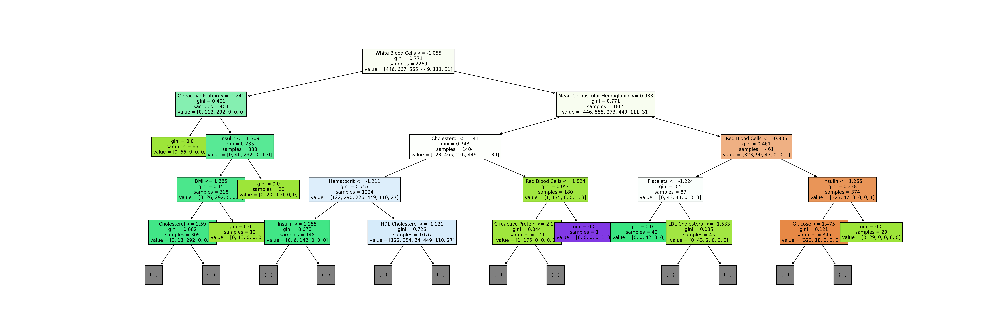

In [23]:
from IPython.display import Image

# Visualize decision tree with larger font size and limited depth
plt.figure(figsize=(30,10))
plot_tree(dt_classifier, filled=True, feature_names=X_train.columns, fontsize=10, max_depth=4)
plt.savefig("decision_tree.png", dpi=300)  # Save the plot as an image with higher resolution
plt.close()  # Close the plot to avoid displaying it inline

# Display the saved image
Image("decision_tree.png")

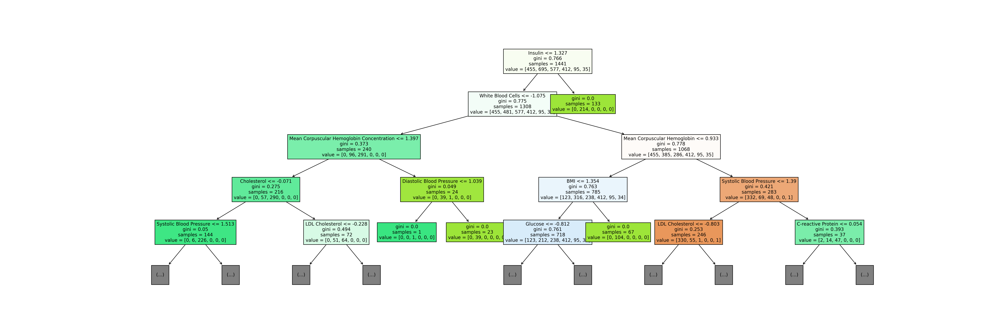

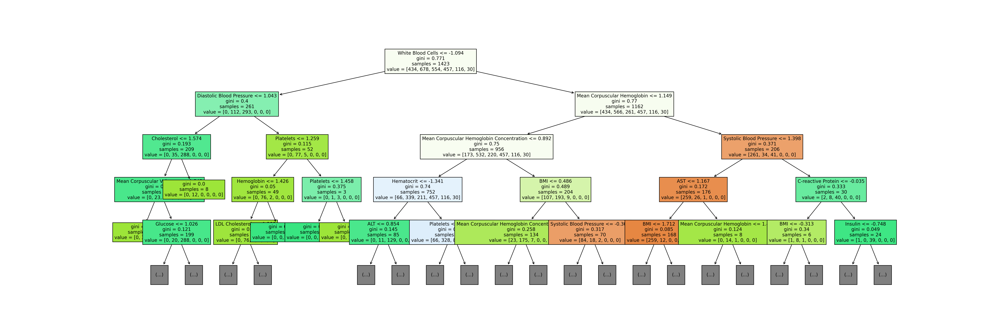

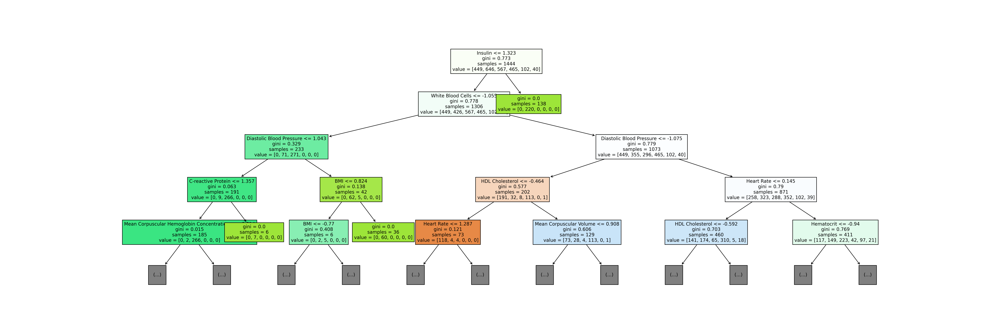

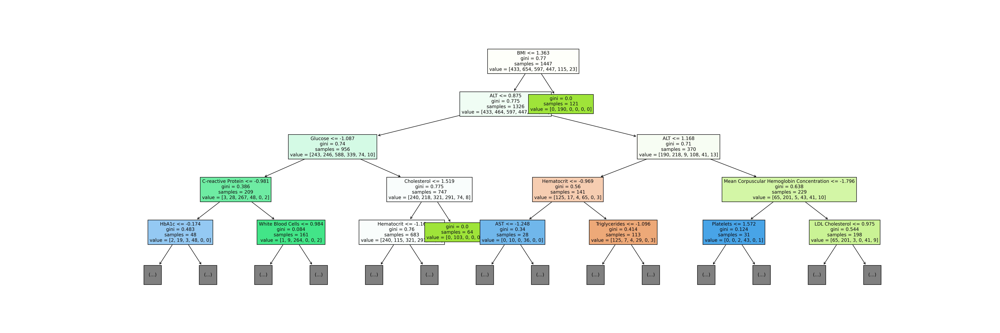

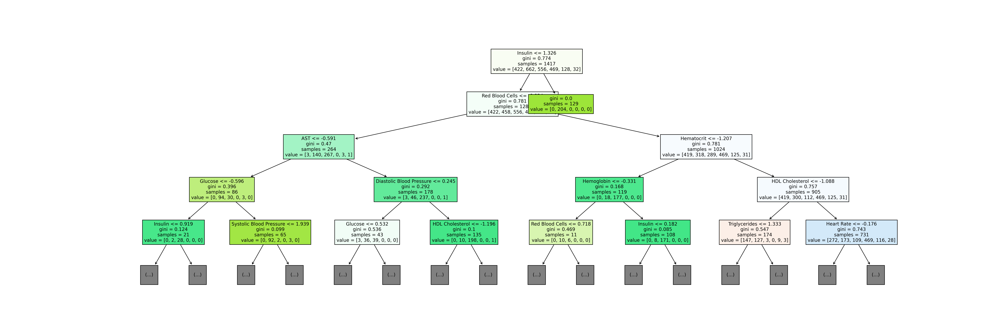

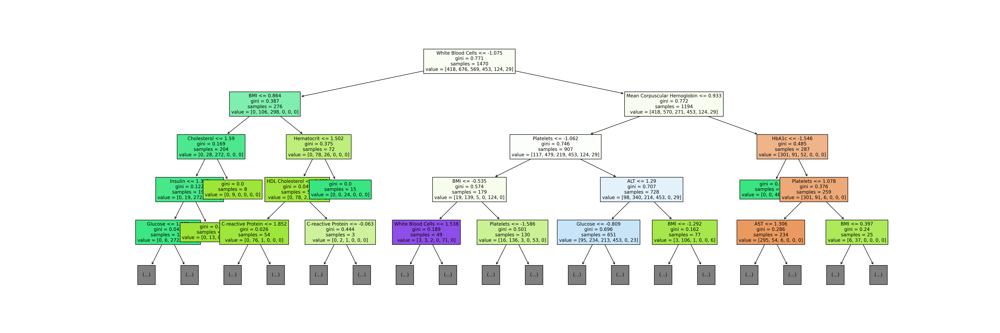

In [24]:
# Get feature importances of trees in the Random Forest
feature_importances = np.mean([tree.feature_importances_ for tree in rf_classifier.estimators_], axis=0)

# Get indices of top 6 important features
top_tree_indices = np.argsort(feature_importances)[::-1][:6]

# Save the plots for the top 6 important trees
for i in top_tree_indices:
    plt.figure(figsize=(30,10))
    plot_tree(rf_classifier.estimators_[i], filled=True, feature_names=X_train.columns, fontsize=10, max_depth=4)
    plt.savefig(f"random_forest_tree_{i}.png", dpi=300)
    plt.close()

# Display the saved images
for i in top_tree_indices:
    display(Image(f"random_forest_tree_{i}.png"))

In this section, we'll construct our Artificial Neural Network (ANN) model and evaluate the resulting scores.

In [25]:
# create ann model
ann = tf.keras.models.Sequential()
ann.add(tf.keras.layers.Dense(256, activation='relu', input_shape=(X_train_scaled.shape[1],)))
ann.add(tf.keras.layers.Dropout(0.2))
ann.add(tf.keras.layers.Dense(128, activation='relu'))
ann.add(tf.keras.layers.Dropout(0.2))
ann.add(tf.keras.layers.Dense(64,activation='relu'))
ann.add(tf.keras.layers.Dropout(0.2))
ann.add( tf.keras.layers.Dense(6, activation='softmax'))

In [26]:
print('train shape:',X_train.shape)
print('test shape: ',X_test.shape)

train shape: (2269, 24)
test shape:  (568, 24)


In [27]:
# Let's add an early stop command.
early_stopping = tf.keras.callbacks.EarlyStopping(patience=30, restore_best_weights=True, monitor='val_loss')

In [28]:
# let's compile our model.
ann.compile(optimizer = 'adam', loss = 'sparse_categorical_crossentropy', metrics = ['accuracy'])

In [29]:
# model fit
history = ann.fit(X_train_scaled, y_train, epochs=100,
                    validation_split=0.1, callbacks=[early_stopping], verbose=2)

Epoch 1/100
64/64 - 2s - loss: 1.1077 - accuracy: 0.5867 - val_loss: 0.4925 - val_accuracy: 0.8722 - 2s/epoch - 33ms/step
Epoch 2/100
64/64 - 0s - loss: 0.4380 - accuracy: 0.8859 - val_loss: 0.2463 - val_accuracy: 0.9295 - 250ms/epoch - 4ms/step
Epoch 3/100
64/64 - 0s - loss: 0.2792 - accuracy: 0.9290 - val_loss: 0.2106 - val_accuracy: 0.9471 - 281ms/epoch - 4ms/step
Epoch 4/100
64/64 - 0s - loss: 0.2118 - accuracy: 0.9388 - val_loss: 0.2108 - val_accuracy: 0.9427 - 323ms/epoch - 5ms/step
Epoch 5/100
64/64 - 0s - loss: 0.1804 - accuracy: 0.9456 - val_loss: 0.1939 - val_accuracy: 0.9559 - 287ms/epoch - 4ms/step
Epoch 6/100
64/64 - 0s - loss: 0.1457 - accuracy: 0.9545 - val_loss: 0.1748 - val_accuracy: 0.9515 - 247ms/epoch - 4ms/step
Epoch 7/100
64/64 - 0s - loss: 0.1184 - accuracy: 0.9628 - val_loss: 0.1905 - val_accuracy: 0.9471 - 234ms/epoch - 4ms/step
Epoch 8/100
64/64 - 0s - loss: 0.1023 - accuracy: 0.9672 - val_loss: 0.1862 - val_accuracy: 0.9515 - 266ms/epoch - 4ms/step
Epoch 9/10

In [30]:
def plot_curves(loss, val_loss, accuracy, val_accuracy):
    epochs = range(1, len(loss) + 1)

    plt.figure(figsize=(12, 6))

    # Plot loss
    plt.subplot(1, 2, 1)
    plt.plot(epochs, loss, 'r', label='Training loss')
    plt.plot(epochs, val_loss, 'b', label='Validation loss')
    plt.title('Training and validation loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

    # Plot accuracy
    plt.subplot(1, 2, 2)
    plt.plot(epochs, accuracy, 'r', label='Training accuracy')
    plt.plot(epochs, val_accuracy, 'b', label='Validation accuracy')
    plt.title('Training and validation accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()

    plt.tight_layout()
    plt.show()

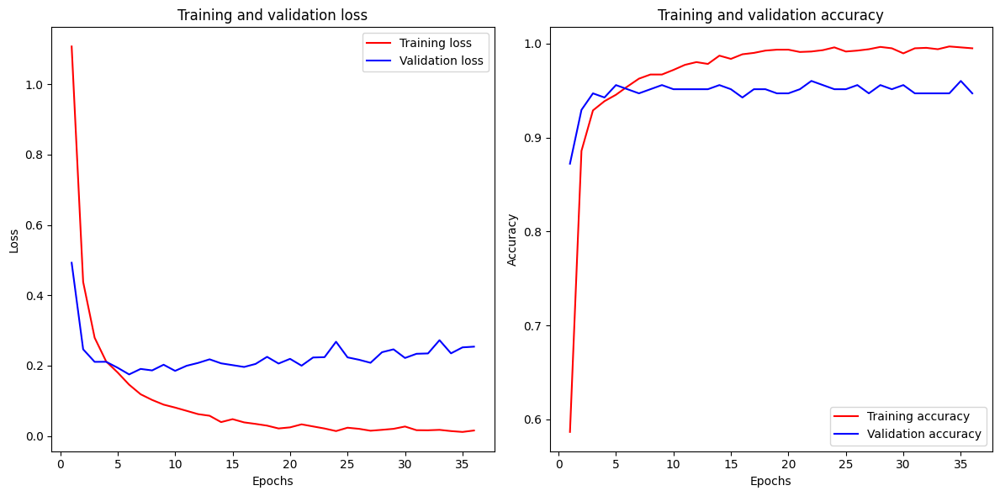

In [31]:
# Extract metrics from the history object
loss = history.history["loss"]
val_loss = history.history["val_loss"]
accuracy = history.history["accuracy"]
val_accuracy = history.history["val_accuracy"]


# Call the plot_curves function with the extracted metrics
plot_curves(loss, val_loss, accuracy, val_accuracy)

# Comparing scores

In [32]:
# Get the final model's predictions on the test set
y_pred_prob = ann.predict(X_test_scaled)

# Convert probabilities to class labels
y_pred = np.argmax(y_pred_prob, axis=1)

# Calculate evaluation metrics
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred, average='weighted')
recall = recall_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')

print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1-score:", f1)

18/18 [==============================] - 0s 2ms/step
Accuracy: 0.9172535211267606
Precision: 0.9066674213517136
Recall: 0.9172535211267606
F1-score: 0.9111218958577109


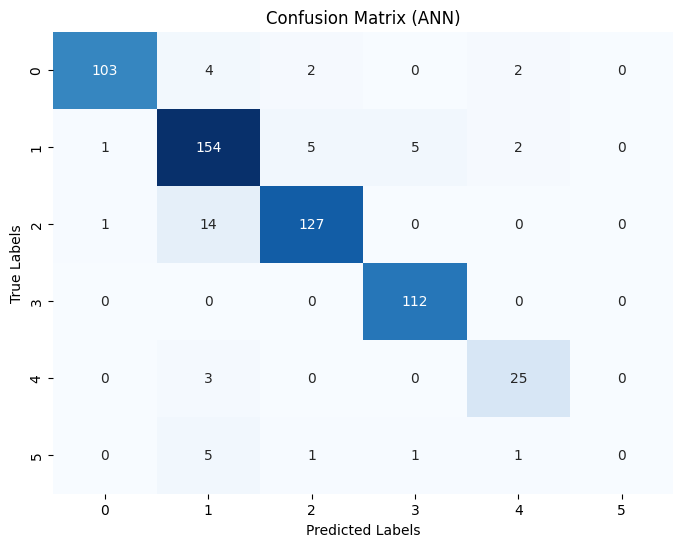

In [33]:
# Get the confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)

# Plot the confusion matrix as a heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.title("Confusion Matrix (ANN)")
plt.show()

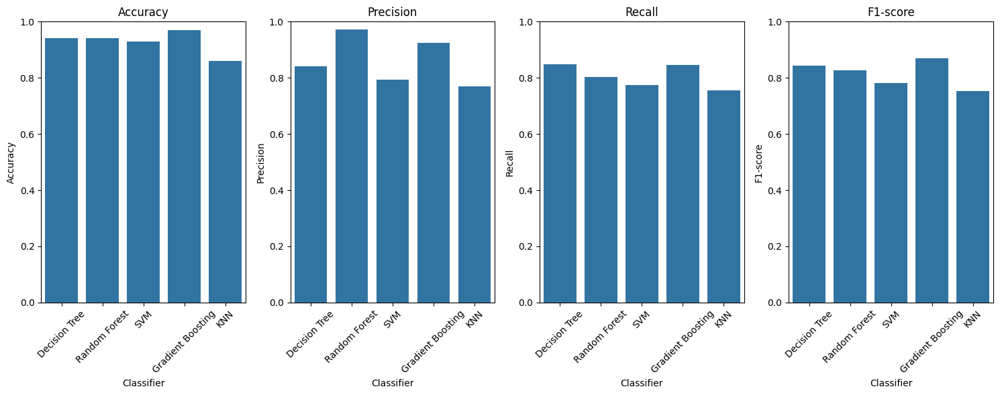

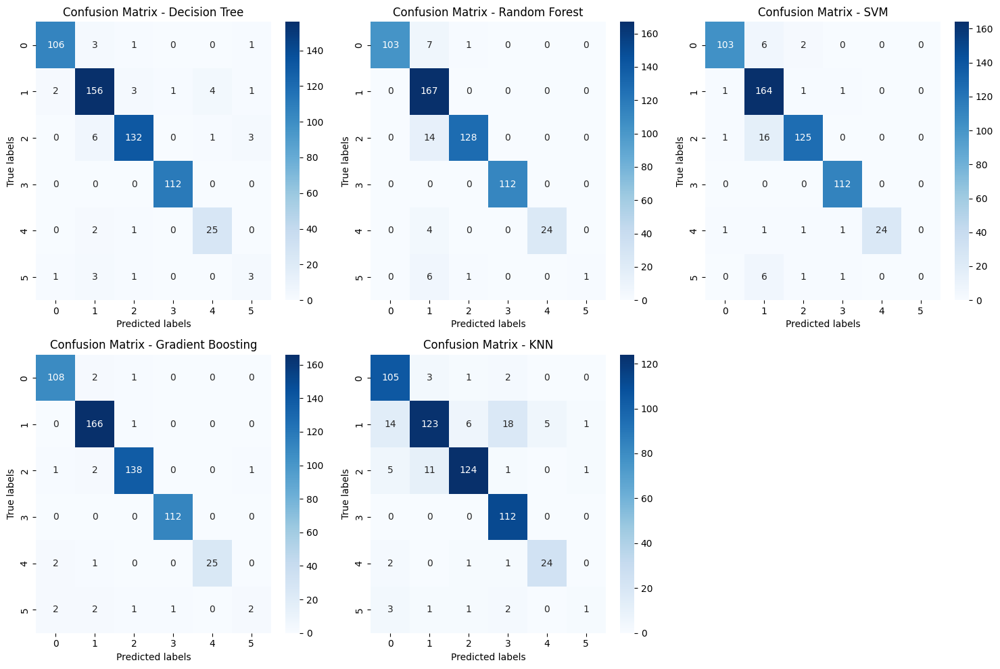

In [34]:
# Plot evaluation metrics
plt.figure(figsize=(15, 6))

# Plot accuracy
plt.subplot(1, 4, 1)
sns.barplot(x='Classifier', y='Accuracy', data=evaluation_metrics)
plt.title('Accuracy')
plt.xticks(rotation=45)
plt.ylim(0, 1)

# Plot precision
plt.subplot(1, 4, 2)
sns.barplot(x='Classifier', y='Precision', data=evaluation_metrics)
plt.title('Precision')
plt.xticks(rotation=45)
plt.ylim(0, 1)

# Plot recall
plt.subplot(1, 4, 3)
sns.barplot(x='Classifier', y='Recall', data=evaluation_metrics)
plt.title('Recall')
plt.xticks(rotation=45)
plt.ylim(0, 1)

# Plot F1-score
plt.subplot(1, 4, 4)
sns.barplot(x='Classifier', y='F1-score', data=evaluation_metrics)
plt.title('F1-score')
plt.xticks(rotation=45)
plt.ylim(0, 1)

plt.tight_layout()
plt.show()

# Plot confusion matrices
plt.figure(figsize=(15, 10))
for i, (clf_name, conf_matrix) in enumerate(conf_matrices.items(), start=1):
    plt.subplot(2, 3, i)
    sns.heatmap(conf_matrix, annot=True, cmap='Blues', fmt='g')
    plt.title(f'Confusion Matrix - {clf_name}')
    plt.xlabel('Predicted labels')
    plt.ylabel('True labels')
plt.tight_layout()
plt.show()

# Testing on data

We will create a new dataframe and add a new column with the disease prediction of the Gradient Boosting model

In [35]:
# Encode the target variable (Disease)
test_df['Disease'] = label_encoder.fit_transform(test_df['Disease'])

# Preprocess the new data
X_new = test_df.drop('Disease', axis=1)
X_new_scaled = scaler.transform(X_new)  # Assuming 'scaler' is the scaler object you used for scaling features

# Make predictions on the new data
gb_pred_new = gb_classifier.predict(X_new_scaled)

# Append predictions to the new DataFrame
test_df['Disease_Prediction_GB'] = label_encoder.inverse_transform(gb_pred_new)

# Display the new DataFrame with predictions
test_df.head(15)

,Glucose,Cholesterol,Hemoglobin,Platelets,White Blood Cells,Red Blood Cells,Hematocrit,Mean Corpuscular Volume,Mean Corpuscular Hemoglobin,Mean Corpuscular Hemoglobin Concentration,...,LDL Cholesterol,HDL Cholesterol,ALT,AST,Heart Rate,Creatinine,Troponin,C-reactive Protein,Disease,Disease_Prediction_GB
415,0.399017,0.508254,0.777394,0.096310,0.925520,0.652505,0.684896,0.380656,0.248189,0.490245,...,0.033037,0.772045,0.253892,0.322486,0.659069,0.774219,0.714177,0.609177,4,4
1596,0.389399,0.462404,0.480595,0.228912,0.781088,0.889100,0.201787,0.298939,0.285184,0.669895,...,0.701782,0.767014,0.749700,0.070974,0.932907,0.382647,0.483517,0.049015,3,3
1322,0.320138,0.442105,0.331686,0.171060,0.990786,0.992377,0.913721,0.880020,0.025514,0.931498,...,0.551162,0.922278,0.485114,0.486317,0.519647,0.076333,0.073240,0.084155,0,0
2271,0.320138,0.442105,0.331686,0.171060,0.990786,0.992377,0.913721,0.880020,0.025514,0.931498,...,0.551162,0.922278,0.485114,0.486317,0.519647,0.076333,0.073240,0.084155,0,0
1966,0.582278,0.114633,0.846266,0.736968,0.487405,0.904046,0.394547,0.065926,0.687458,0.459895,...,0.713441,0.420996,0.211078,0.611674,0.928161,0.147385,0.751778,0.571952,3,3
354,0.729868,0.905026,0.520473,0.306955,0.743164,0.667150,0.769573,0.183771,0.246542,0.161920,...,0.977656,0.341007,0.797158,0.994460,0.591303,0.425296,0.007490,0.196192,1,1
965,0.012956,0.336925,0.451218,0.175006,0.734664,0.382770,0.656463,0.177502,0.808162,0.684499,...,0.311568,0.595083,0.155866,0.885812,0.636125,0.132226,0.716519,0.006121,1,1
1599,0.582278,0.114633,0.846266,0.736968,0.487405,0.904046,0.394547,0.065926,0.687458,0.459895,...,0.713441,0.420996,0.211078,0.611674,0.928161,0.147385,0.751778,0.571952,3,3
527,0.175103,0.473982,0.493573,0.905766,0.440257,0.829274,0.047324,0.247933,0.724023,0.208393,...,0.217757,0.473467,0.286915,0.574975,0.661189,0.126547,0.110734,0.235140,2,2
1770,0.353734,0.757757,0.755007,0.012594,0.227684,0.425117,0.387461,0.461418,0.305588,0.741120,...,0.729376,0.615543,0.794735,0.233890,0.612188,0.407891,0.426863,0.532100,4,4


We will also make a column for the prediction of each model

In [41]:
# Example for Decision Tree Classifier
dt_pred_new = dt_classifier.predict(X_new_scaled)
test_df['Disease_Prediction_DT'] = label_encoder.inverse_transform(dt_pred_new)

# Example for Random Forest Classifier
rf_pred_new = rf_classifier.predict(X_new_scaled)
test_df['Disease_Prediction_RF'] = label_encoder.inverse_transform(rf_pred_new)

# Example for Support Vector Machine Classifier
svm_pred_new = svm_classifier.predict(X_new_scaled)
test_df['Disease_Prediction_SVM'] = label_encoder.inverse_transform(svm_pred_new)

# Example for K-Nearest Neighbors Classifier
knn_pred_new = knn_classifier.predict(X_new_scaled)
test_df['Disease_Prediction_KNN'] = label_encoder.inverse_transform(knn_pred_new)

# Example for Artificial Neural Network Classifier
ann_pred_new = ann.predict(X_new_scaled)
ann_pred_labels = np.argmax(ann_pred_new, axis=1)  # Convert one-hot encoded predictions to labels
test_df['Disease_Prediction_ANN'] = label_encoder.inverse_transform(ann_pred_labels)


test_df.head(15)

18/18 [==============================] - 0s 2ms/step


,Glucose,Cholesterol,Hemoglobin,Platelets,White Blood Cells,Red Blood Cells,Hematocrit,Mean Corpuscular Volume,Mean Corpuscular Hemoglobin,Mean Corpuscular Hemoglobin Concentration,...,Creatinine,Troponin,C-reactive Protein,Disease,Disease_Prediction_GB,Disease_Prediction_DT,Disease_Prediction_RF,Disease_Prediction_SVM,Disease_Prediction_KNN,Disease_Prediction_ANN
415,0.399017,0.508254,0.777394,0.096310,0.925520,0.652505,0.684896,0.380656,0.248189,0.490245,...,0.774219,0.714177,0.609177,4,4,4,4,4,4,4
1596,0.389399,0.462404,0.480595,0.228912,0.781088,0.889100,0.201787,0.298939,0.285184,0.669895,...,0.382647,0.483517,0.049015,3,3,3,3,3,3,3
1322,0.320138,0.442105,0.331686,0.171060,0.990786,0.992377,0.913721,0.880020,0.025514,0.931498,...,0.076333,0.073240,0.084155,0,0,0,0,0,0,0
2271,0.320138,0.442105,0.331686,0.171060,0.990786,0.992377,0.913721,0.880020,0.025514,0.931498,...,0.076333,0.073240,0.084155,0,0,0,0,0,0,0
1966,0.582278,0.114633,0.846266,0.736968,0.487405,0.904046,0.394547,0.065926,0.687458,0.459895,...,0.147385,0.751778,0.571952,3,3,3,3,3,3,3
354,0.729868,0.905026,0.520473,0.306955,0.743164,0.667150,0.769573,0.183771,0.246542,0.161920,...,0.425296,0.007490,0.196192,1,1,1,1,1,1,1
965,0.012956,0.336925,0.451218,0.175006,0.734664,0.382770,0.656463,0.177502,0.808162,0.684499,...,0.132226,0.716519,0.006121,1,1,1,1,1,1,1
1599,0.582278,0.114633,0.846266,0.736968,0.487405,0.904046,0.394547,0.065926,0.687458,0.459895,...,0.147385,0.751778,0.571952,3,3,3,3,3,3,3
527,0.175103,0.473982,0.493573,0.905766,0.440257,0.829274,0.047324,0.247933,0.724023,0.208393,...,0.126547,0.110734,0.235140,2,2,2,2,2,2,2
1770,0.353734,0.757757,0.755007,0.012594,0.227684,0.425117,0.387461,0.461418,0.305588,0.741120,...,0.407891,0.426863,0.532100,4,4,4,4,4,4,4


In [60]:
test_df.shape

(568, 31)

In order to visualize better the predictions, we will see the value counts of each disease prediction from the models

In [59]:
# Get value counts for each column
disease_value_counts = test_df['Disease'].value_counts()
gb_value_counts = test_df['Disease_Prediction_GB'].value_counts()
dt_value_counts = test_df['Disease_Prediction_DT'].value_counts()
rf_value_counts = test_df['Disease_Prediction_RF'].value_counts()
svm_value_counts = test_df['Disease_Prediction_SVM'].value_counts()
knn_value_counts = test_df['Disease_Prediction_KNN'].value_counts()
ann_value_counts = test_df['Disease_Prediction_ANN'].value_counts()

# Display value counts for each column
print("Value counts for Disease:")
print(disease_value_counts)
print("\nValue counts for Disease_Prediction_GB:")
print(gb_value_counts)
print("\nValue counts for Disease_Prediction_DT:")
print(dt_value_counts)
print("\nValue counts for Disease_Prediction_RF:")
print(rf_value_counts)
print("\nValue counts for Disease_Prediction_SVM:")
print(svm_value_counts)
print("\nValue counts for Disease_Prediction_KNN:")
print(knn_value_counts)
print("\nValue counts for Disease_Prediction_ANN:")
print(ann_value_counts)

Value counts for Disease:
Disease
1    166
2    141
3    119
0    110
4     24
5      8
Name: count, dtype: int64

Value counts for Disease_Prediction_GB:
Disease_Prediction_GB
1    167
2    141
3    119
0    112
4     22
5      7
Name: count, dtype: int64

Value counts for Disease_Prediction_DT:
Disease_Prediction_DT
1    163
2    140
3    120
0    111
4     25
5      9
Name: count, dtype: int64

Value counts for Disease_Prediction_RF:
Disease_Prediction_RF
1    172
2    140
3    119
0    109
4     22
5      6
Name: count, dtype: int64

Value counts for Disease_Prediction_SVM:
Disease_Prediction_SVM
1    177
2    142
3    120
0    108
4     21
Name: count, dtype: int64

Value counts for Disease_Prediction_KNN:
Disease_Prediction_KNN
1    147
3    138
2    138
0    116
4     25
5      4
Name: count, dtype: int64

Value counts for Disease_Prediction_ANN:
Disease_Prediction_ANN
1    174
2    141
3    121
0    106
4     25
5      1
Name: count, dtype: int64


# Conclusion

This project examines the relationship between blood parameters and various heart diseases, while also comparing the effectiveness of different machine learning classification models. Among these models, Gradient Boosting emerged as the most effective, as evidenced by the confusion matrix and its performance when tested with the validation dataset, closely matching the original values. Although other models performed less optimally compared to Gradient Boosting, they still achieved notably high scores. Overall, this underscores how machine learning models can significantly aid in predicting heart diseases.